In [1]:
import pandas as pd
import numpy as np
import os
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (12,12)

In [2]:
filename = '../csv_detection_info/3, MCD.csv'
filename_clean = '../csv_detection_info_clean/3, MCD.csv'
saved_cropped_image = '//nmbu.no/LargeFile/Project/CubiAI/preprocess/cropped/3, MCD'

In [3]:
detection_df = pd.read_csv(filename)

In [4]:
detection_df

,base_path,filename,ax0_min,ax0_max,ax1_min,ax1_max,confidence,diagnosis,diagnosis_raw
0,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1430.1216030460.10.0.0.10.578...,848,1039,1164,1357,0.797153,3,"3, MCD"
1,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.17743.20180710.121408.0.dcm,361,457,672,769,0.996734,3,"3, MCD"
2,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.17743.20181015.131421.0.dcm,381,542,595,756,0.973306,3,"3, MCD"
3,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.18290.20180925.120150.0.dcm,360,508,691,838,0.868939,3,"3, MCD"
4,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.29195.20180712.155245.0.dcm,918,1103,952,1135,0.999985,3,"3, MCD"
...,...,...,...,...,...,...,...,...,...
330,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.13727193961.1401.48454.34800.17077....,665,844,510,689,0.999991,3,"3, MCD"
331,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.13987587591.6949.51017.43674.22503....,871,1028,882,1038,0.999997,3,"3, MCD"
332,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.14122063039.52559.22853.36884.48797...,837,973,818,955,0.999999,3,"3, MCD"
333,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1430.87290889.192.168.0.112.6...,747,948,1444,1647,0.977926,3,"3, MCD"


### [Optional] Sort by confidence (filter out bad prediction)

In [5]:
detection_df[detection_df.confidence < 0.5].index

Int64Index([25, 26, 38, 166, 192, 219, 220, 267, 281, 308], dtype='int64')

Note that there is one case that is not good

### Look at the crop images

Are they reasonable, if not, mark the "weird", "wrong detected" image indice before saving it back to the clean folder

In [6]:
# plot every 9 of them

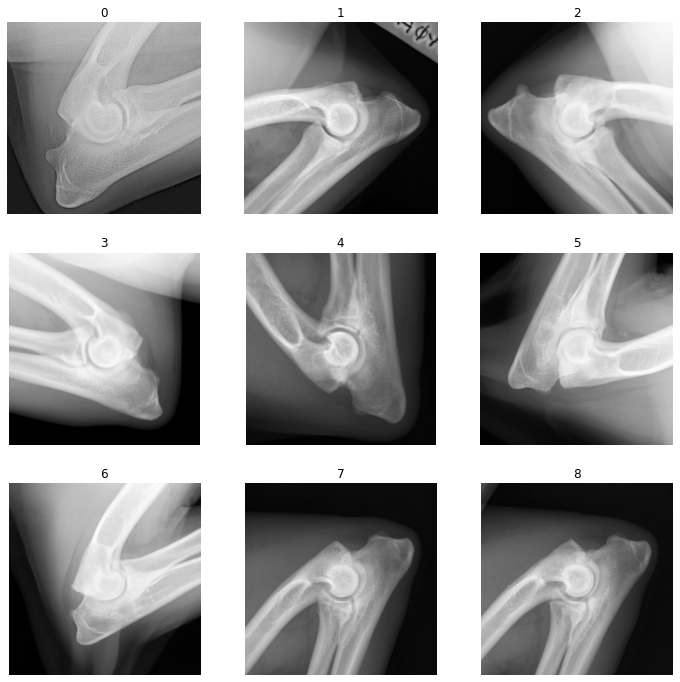

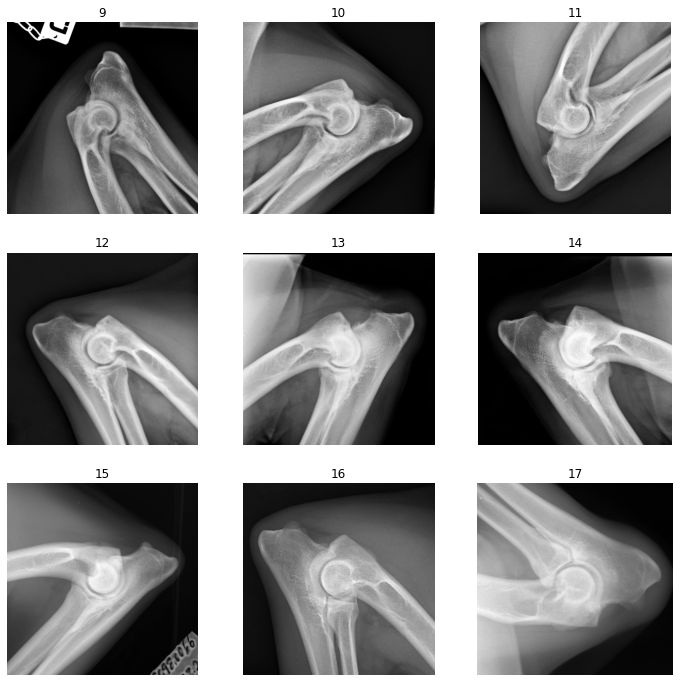

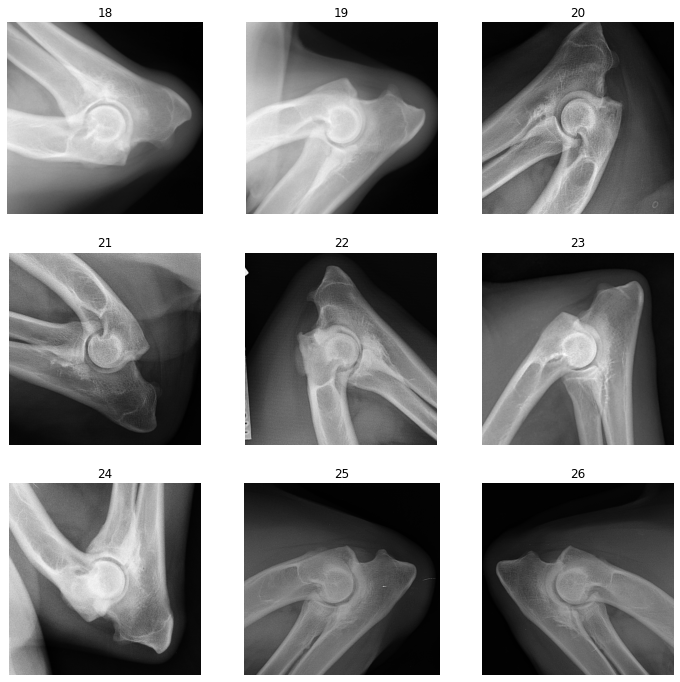

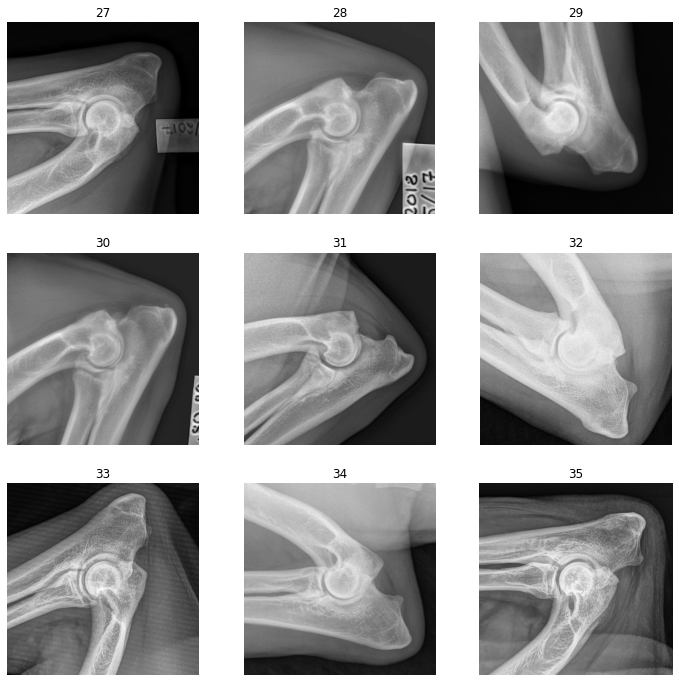

C:\NMBU\TEMP\ipykernel_10340\89006417.py:5: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(img, 'gray')
C:\NMBU\TEMP\ipykernel_10340\89006417.py:5: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(img, 'gray')


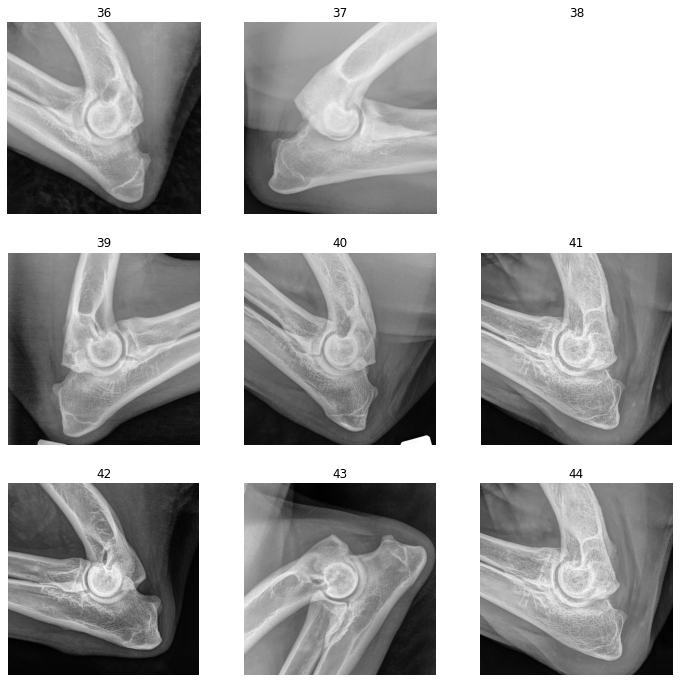

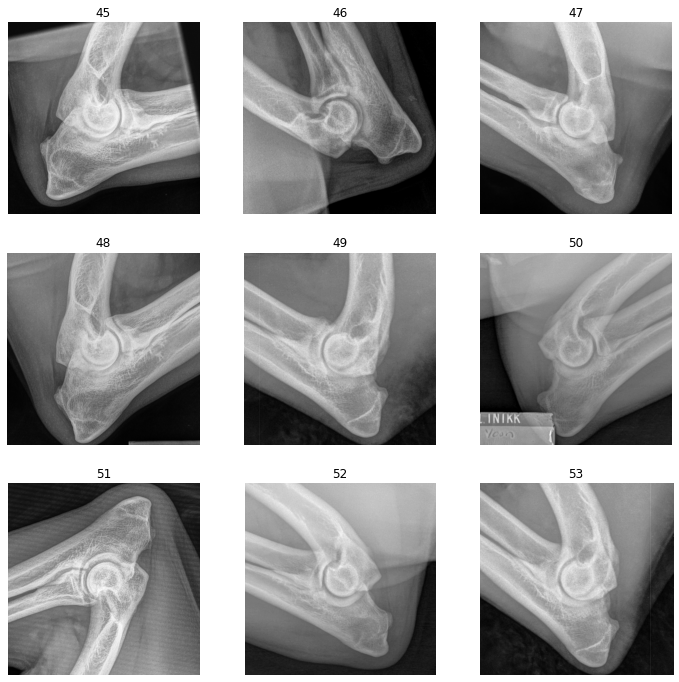

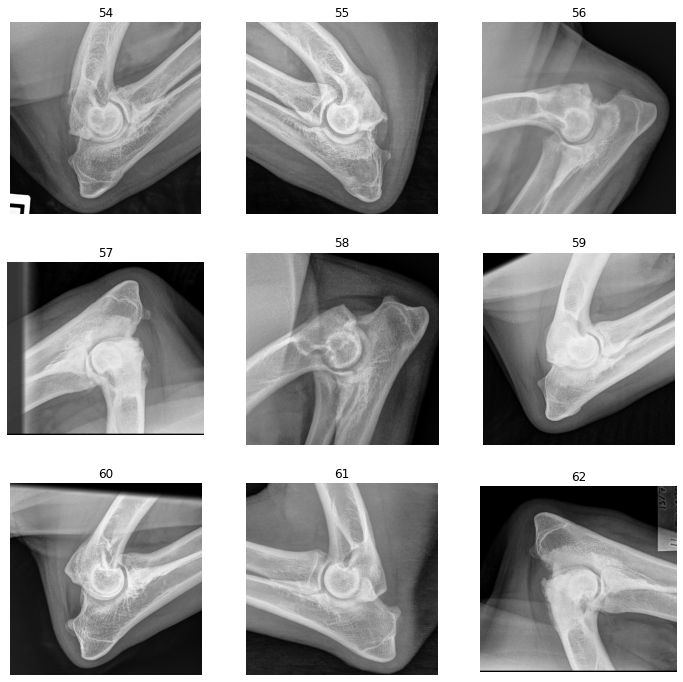

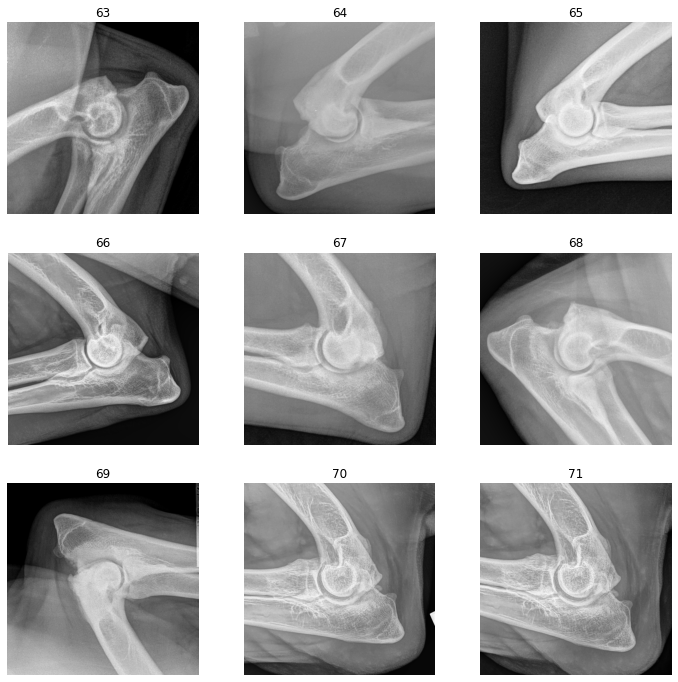

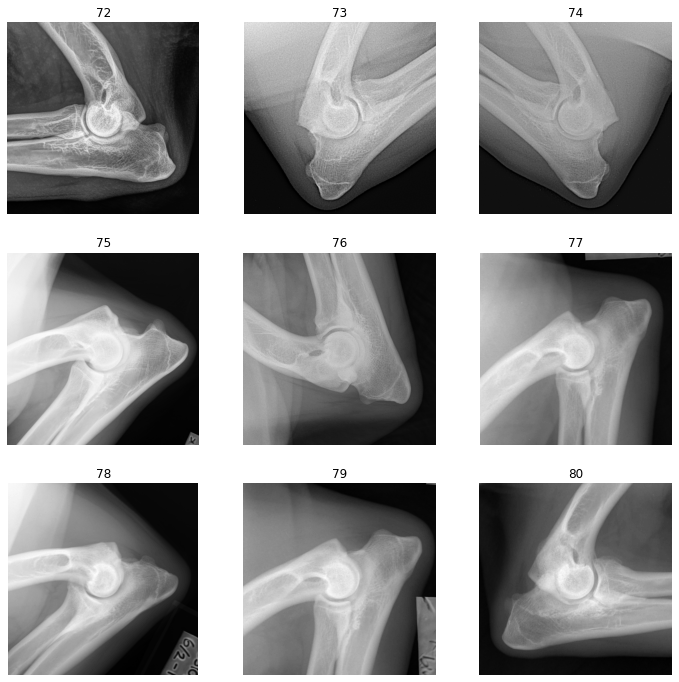

...

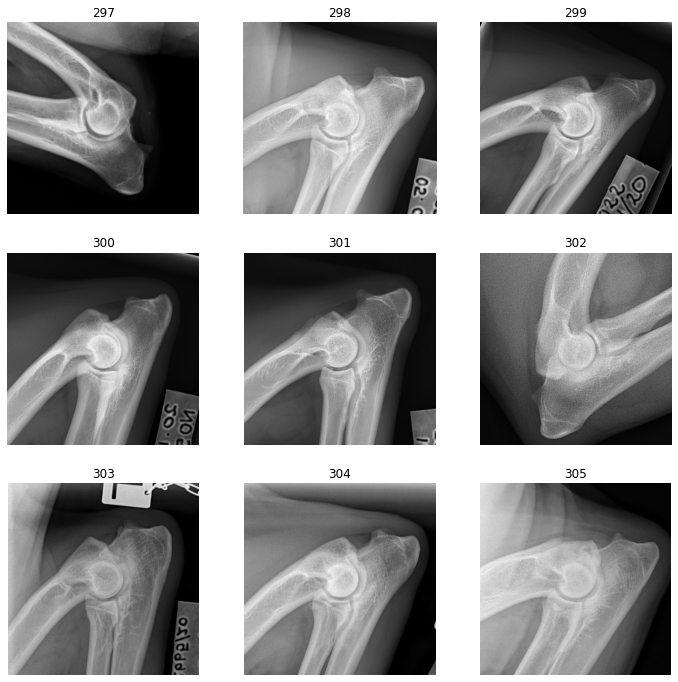

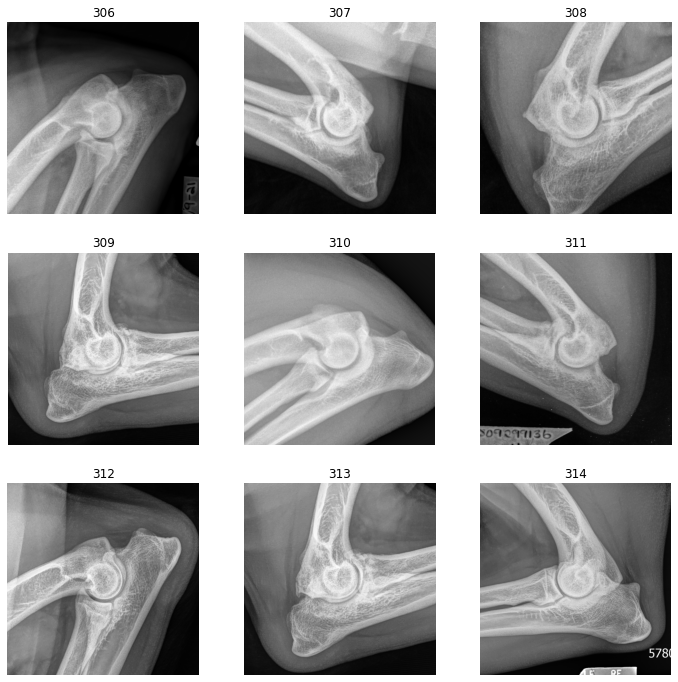

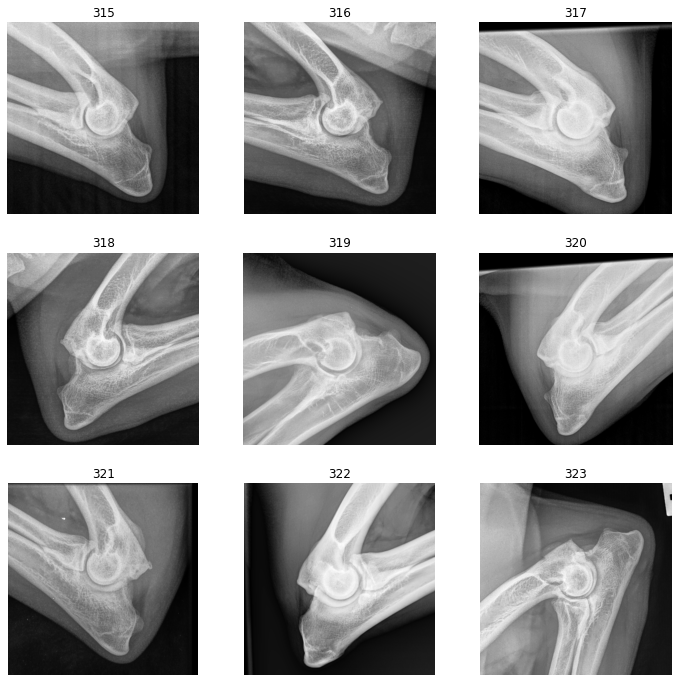

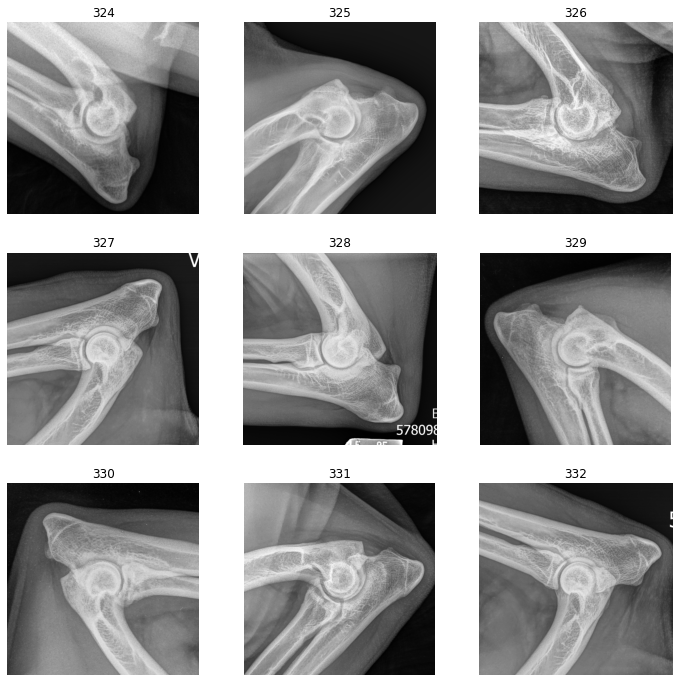

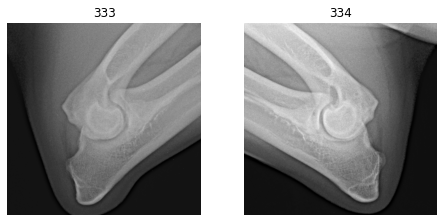

In [7]:
for id, item in detection_df.iterrows():
    fn = item['filename']
    img = np.load(saved_cropped_image + '/' + fn + '.npy')
    plt.subplot(3,3, (id%9) + 1)
    plt.imshow(img, 'gray')
    plt.axis('off')
    plt.title(str(id))
    
    if (id%9) == 8:
        plt.show()
        
plt.show()

## Remove bad detection items

In [8]:
remove_indice = [38, 220, 230, 267, 281]
detection_df[~detection_df.index.isin(remove_indice)]

,base_path,filename,ax0_min,ax0_max,ax1_min,ax1_max,confidence,diagnosis,diagnosis_raw
0,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1430.1216030460.10.0.0.10.578...,848,1039,1164,1357,0.797153,3,"3, MCD"
1,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.17743.20180710.121408.0.dcm,361,457,672,769,0.996734,3,"3, MCD"
2,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.17743.20181015.131421.0.dcm,381,542,595,756,0.973306,3,"3, MCD"
3,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.18290.20180925.120150.0.dcm,360,508,691,838,0.868939,3,"3, MCD"
4,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.29195.20180712.155245.0.dcm,918,1103,952,1135,0.999985,3,"3, MCD"
...,...,...,...,...,...,...,...,...,...
330,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.13727193961.1401.48454.34800.17077....,665,844,510,689,0.999991,3,"3, MCD"
331,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.13987587591.6949.51017.43674.22503....,871,1028,882,1038,0.999997,3,"3, MCD"
332,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.14122063039.52559.22853.36884.48797...,837,973,818,955,0.999999,3,"3, MCD"
333,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1430.87290889.192.168.0.112.6...,747,948,1444,1647,0.977926,3,"3, MCD"


In [9]:
new_detection_df = detection_df[~detection_df.index.isin(remove_indice)]

In [10]:
new_detection_df.to_csv(filename_clean, index=False)